# Инфраструктура Python. Визуализация

Рабочей лошадкой для графиков является библиотека `matplotlib` (входит в Anaconda), воспроизводящая графические возможности Matlab. Галерея примеров http://matplotlib.org/gallery.html

Библиотека `seaborn` (тоже входит в Anaconda) содержит несколько полезных видов графиков http://seaborn.pydata.org/examples/index.html и больше заточена под статистические применения. До версии 0.8.0 она при импорте заменяла дефолтный стиль `matplotlib` на несколько более эстетичный, но затем `matplotlib` огламурили и теперь для того же эффекта нужен явный вызов `seaborn.set()`.

Функции `plot` и `scatter` принимают иксы и игреки отображаемых точек и дополнительные аргументы стиля отображения. При этом `plot` рисует линию между ними в том же порядке, в котором они идут в массиве. Прочее на графике (оси, подписи, надписи на графике, риски на осях и подписи к ним, логарифмический или линейный масштаб) настраивается дополнительными вызовами.

In [3]:
import IPython, pandas, seaborn
%pylab inline

Populating the interactive namespace from numpy and matplotlib


Магия `axes().set_aspect('equal')` устанавливает равный масштаб по осям.

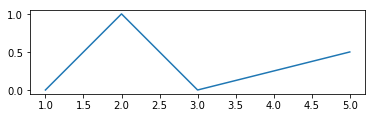

In [8]:
axes().set_aspect('equal')
plot([1,2,3,5], [0,1,0,0.5]);

Заголовок графика `title`. Подписи осей `xlabel` и `ylabel`, риски на осях `xticks` и `yticks`. Текст на графике `text`. Метки графиков параметр `label=`, подпись с именами меток `legend`.

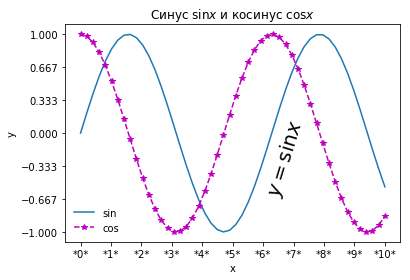

In [316]:
xx = linspace(0, 10)

title(u'Синус $\sin{x}$ и косинус $\cos{x}$')

xticks(range(0, 11), ['*%d*' % i for i in range(0, 11)])
yticks(arange(-1, 1.01, 1./3))
xlabel('x')
ylabel('y')

plot(xx, sin(xx), label='sin');
text(6, 0, '$y = \sin{x}$', fontsize=20, rotation=73)

plot(xx, cos(xx), '*m--', label='cos')

legend(frameon=False);

Магия `'*m--'` задает тип маркера marker `*`, цвет color `m` (magenta) и тип линии linestyle `--`. Полный список https://matplotlib.org/api/pyplot_api#matplotlib.pyplot.plot

Логарифмический масштаб по осям `xscale` и `yscale`. Пределы графика `xlim` и `ylim`. Сетка параллельно осям `grid`.

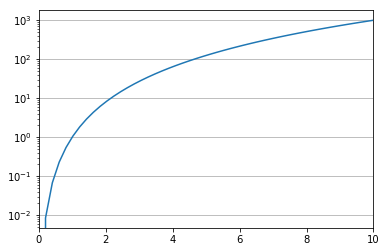

In [4]:
xx = linspace(0, 10)
yscale('log')
xlim([0,10])
grid(True, axis='y')
plot(xx, xx ** 3);

Параметрические графики не требуют никаких новых знаний. Фигура Лиссажу

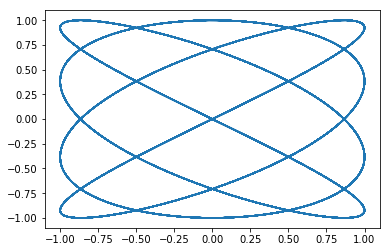

In [6]:
tt = linspace(0, 100, 10000)
plot(sin(tt * 4), cos(tt * 3));

График в полярных координатах — параметр `projection='polar'` у `subplot`. Полярная роза

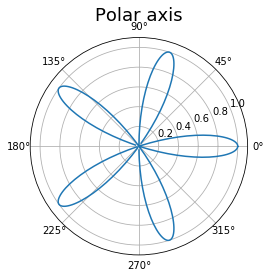

In [5]:
theta = arange(0, 2 * pi, 0.01)
r = cos(5 * theta)

subplot(111, projection='polar')
title("Polar axis", fontsize=18)
plot(theta, r)
grid(True)

Для выделения некоторой координаты служит `axvline` и `axhline`, интервала координат `axvspan` и `axhspan`, направления или точки — `arrow` и `annotate`.

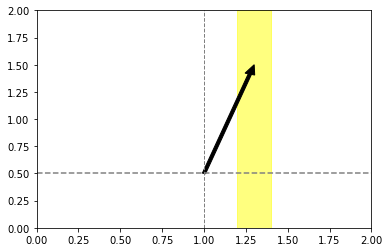

In [7]:
xlim([0,2])
ylim([0,2])
arrow(1.0, 0.5, 0.3, 1, length_includes_head=True, width=0.02, color='k')
axvspan(1.2, 1.4, color='yellow', alpha=0.5)
axvline(x=1, color='#808080', linestyle='--', lw=1)
axhline(y=0.5, color=(0.5,0.5,0.5), linestyle='--');

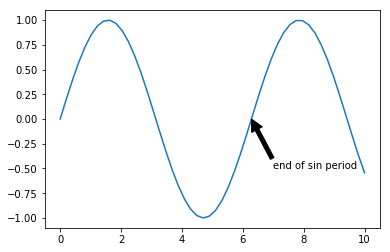

In [7]:
xx = linspace(0, 10)
yy = sin(xx)

annotate('end of sin period', xy=(2*pi, 0), xytext=(7, -0.5), arrowprops={'facecolor': 'black'})
plot(xx, yy);

Для выделения области служат `fill_between` и `fill_betweenx`.

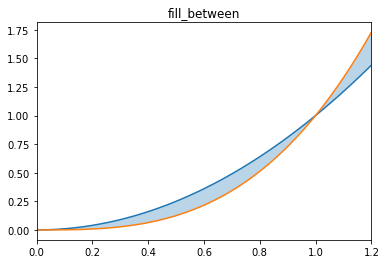

In [22]:
title('fill_between')
xlim([0,1.2])
xx = linspace(0, 1.2)
plot(xx, xx ** 2);
plot(xx, xx ** 3);
fill_between(xx, xx ** 2, xx ** 3, alpha=0.3);

Визуализировать точки на плоскости можно с помощью `scatter` или `hexbin`.

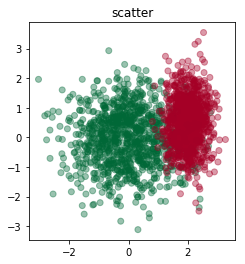

In [15]:
seed(0)
xx = r_[randn(1000), randn(1000) * 0.4 + 2]
yy = r_[randn(1000), randn(1000) * 0.8 + 0.5]
col = r_[zeros(1000), ones(1000)]

title('scatter')
axes().set_aspect('equal')
scatter(xx, yy, alpha=0.4, c=col, cmap=cm.RdYlGn_r);

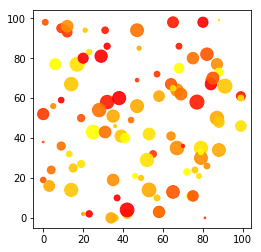

In [9]:
seed(0)
xs = [randint(100) for i in range(100)]
ys = [randint(100) for i in range(100)]
sizes = [randint(200) for i in range(100)]
colors = [randint(10) for i in range(100)]
scatter(xs, ys, s=sizes, c=colors, alpha=0.9, cmap='autumn')
axis('scaled');

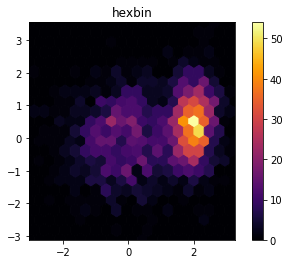

In [13]:
title('hexbin')
xlim(min(xx), max(xx))
ylim(min(yy), max(yy))
axes().set_aspect('equal')
hexbin(xx, yy, gridsize=20, cmap='inferno')
colorbar();

Это пример «анатомия графика» из документации к matplotlib, описывающий его компоненты

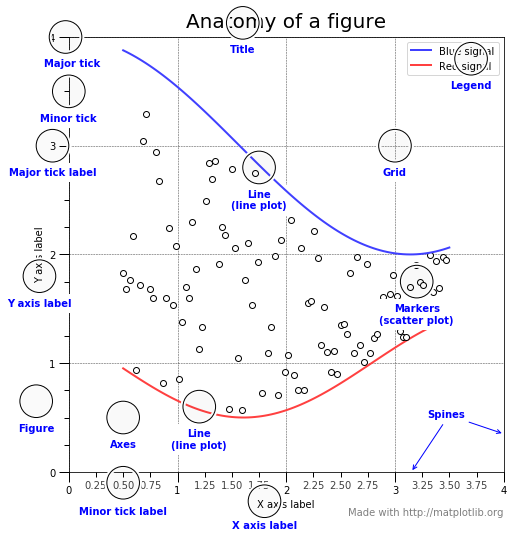

In [38]:
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator, MultipleLocator, FuncFormatter

np.random.seed(19680801)

X = np.linspace(0.5, 3.5, 100)
Y1 = 3+np.cos(X)
Y2 = 1+np.cos(1+X/0.75)/2
Y3 = np.random.uniform(Y1, Y2, len(X))

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, aspect=1)


def minor_tick(x, pos):
    if not x % 1.0:
        return ""
    return "%.2f" % x

ax.xaxis.set_major_locator(MultipleLocator(1.000))
ax.xaxis.set_minor_locator(AutoMinorLocator(4))
ax.yaxis.set_major_locator(MultipleLocator(1.000))
ax.yaxis.set_minor_locator(AutoMinorLocator(4))
ax.xaxis.set_minor_formatter(FuncFormatter(minor_tick))

ax.set_xlim(0, 4)
ax.set_ylim(0, 4)

ax.tick_params(which='major', width=1.0)
ax.tick_params(which='major', length=10)
ax.tick_params(which='minor', width=1.0, labelsize=10)
ax.tick_params(which='minor', length=5, labelsize=10, labelcolor='0.25')

ax.grid(linestyle="--", linewidth=0.5, color='.25', zorder=-10)

ax.plot(X, Y1, c=(0.25, 0.25, 1.00), lw=2, label="Blue signal", zorder=10)
ax.plot(X, Y2, c=(1.00, 0.25, 0.25), lw=2, label="Red signal")
ax.plot(X, Y3, linewidth=0,
        marker='o', markerfacecolor='w', markeredgecolor='k')

ax.set_title("Anatomy of a figure", fontsize=20, verticalalignment='bottom')
ax.set_xlabel("X axis label")
ax.set_ylabel("Y axis label")

ax.legend()


def draw_circle(x, y, radius=0.15):
    from matplotlib.patches import Circle
    from matplotlib.patheffects import withStroke
    circle = Circle((x, y), radius, clip_on=False, zorder=10, linewidth=1,
                    edgecolor='black', facecolor=(0, 0, 0, .0125),
                    path_effects=[withStroke(linewidth=5, foreground='w')])
    ax.add_artist(circle)


def draw_text(x, y, text):
    ax.text(x, y, text, backgroundcolor="white",
            ha='center', va='top', weight='bold', color='blue')


# Minor tick
draw_circle(0.50, -0.10)
draw_text(0.50, -0.32, "Minor tick label")

# Major tick
draw_circle(-0.03, 4.00)
draw_text(0.03, 3.80, "Major tick")

# Minor tick
draw_circle(0.00, 3.50)
draw_text(0.00, 3.30, "Minor tick")

# Major tick label
draw_circle(-0.15, 3.00)
draw_text(-0.15, 2.80, "Major tick label")

# X Label
draw_circle(1.80, -0.27)
draw_text(1.80, -0.45, "X axis label")

# Y Label
draw_circle(-0.27, 1.80)
draw_text(-0.27, 1.6, "Y axis label")

# Title
draw_circle(1.60, 4.13)
draw_text(1.60, 3.93, "Title")

# Blue plot
draw_circle(1.75, 2.80)
draw_text(1.75, 2.60, "Line\n(line plot)")

# Red plot
draw_circle(1.20, 0.60)
draw_text(1.20, 0.40, "Line\n(line plot)")

# Scatter plot
draw_circle(3.20, 1.75)
draw_text(3.20, 1.55, "Markers\n(scatter plot)")

# Grid
draw_circle(3.00, 3.00)
draw_text(3.00, 2.80, "Grid")

# Legend
draw_circle(3.70, 3.80)
draw_text(3.70, 3.60, "Legend")

# Axes
draw_circle(0.5, 0.5)
draw_text(0.5, 0.3, "Axes")

# Figure
draw_circle(-0.3, 0.65)
draw_text(-0.3, 0.45, "Figure")

color = 'blue'
ax.annotate('Spines', xy=(4.0, 0.35), xycoords='data',
            xytext=(3.3, 0.5), textcoords='data',
            weight='bold', color=color,
            arrowprops=dict(arrowstyle='->',
                            connectionstyle="arc3",
                            color=color))

ax.annotate('', xy=(3.15, 0.0), xycoords='data',
            xytext=(3.45, 0.45), textcoords='data',
            weight='bold', color=color,
            arrowprops=dict(arrowstyle='->',
                            connectionstyle="arc3",
                            color=color))

ax.text(4.0, -0.4, "Made with http://matplotlib.org",
        fontsize=10, ha="right", color='.5')

plt.show()

Несколько графиков можно разместить на одном холсте, используя `subplot`, задавая число строк, столбцов сетки и номер графика, либо с помощью `subplot2grid`, задавая размер сетки, размер ячейки и ее позиция в сетке. Параметр `figsize=` задает размер холста в дюймах.

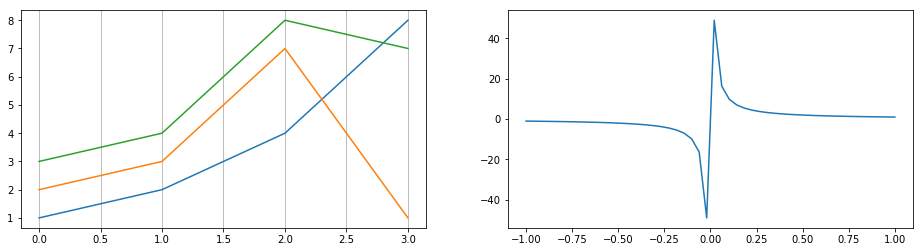

In [16]:
figure(figsize=(16,4))
subplot(1, 2, 1) # или subplot(121)
grid(True, axis='x')
plot([[1,2,3], [2,3,4], [4,7,8], [8,1,7]])

subplot(1, 2, 2)
xxx = linspace(-1.0, 1.0)
plot(xxx, 1.0 / xxx);

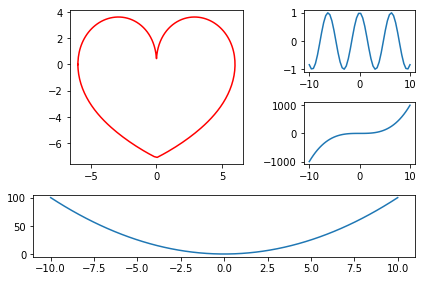

In [55]:
fig = figure()

subplot2grid((3, 3), (0, 0), rowspan=2, colspan=2)

magic1 = lambda x: abs(abs(x+1) % 2.0 - 1)
magic2 = lambda x: 3 * (magic1((x - pi/2)/pi)-1./2)
magic3 = lambda x: x**3-x**2
xs = linspace(-pi, pi, num=200)
r = 6 + magic3(magic2(xs))

gca().set_aspect('equal')
plot(r * cos(xs), r * sin(xs), 'r')

xs = linspace(-10, 10)
subplot2grid((3, 3), (0, 2))
plot(xs, cos(xs));

subplot2grid((3, 3), (2, 0), colspan=3)
plot(xs, xs ** 2);

subplot2grid((3, 3), (1, 2))
plot(xs, xs ** 3);

fig.tight_layout()

Добавить ось с другой стороны `twinx`, `twiny`. При этом меняется текущая настраиваемая ось.

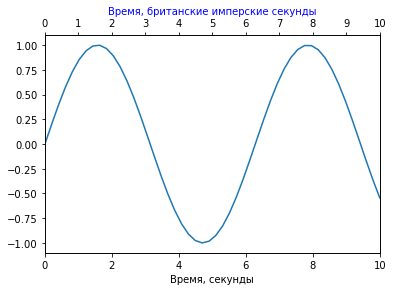

In [82]:
xlabel(u'Время, секунды')
xlim([0,10])
twiny()
xlim([0,10])
xticks(range(0, 10 + 1))
xlabel(u'Время, британские имперские секунды', color='b')
xx = linspace(0, 10)
plot(xx, sin(xx));

Оси можно скрывать и переносить

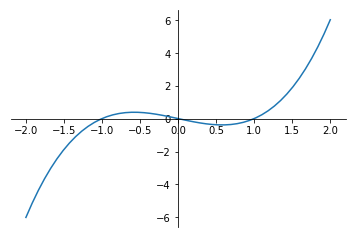

In [665]:
axes().spines['right'].set_color('none')
axes().spines['top'].set_color('none')
axes().xaxis.set_ticks_position('bottom')
axes().spines['bottom'].set_position(('data',0)) # set position of x spine to x=0
axes().yaxis.set_ticks_position('left')
axes().spines['left'].set_position(('data',0))   # set position of y spine to y=0

xx = linspace(-2, 2)
plot(xx, (xx-1)*xx*(xx+1));

Для откладывания по осям меток, связанных с датами, `matplotlib` поддерживает локаторы и форматтеры в модуле `matplotlib.dates`.

In [123]:
import dateutil, requests
from io import BytesIO

startdate = datetime.datetime(2013, 1, 1)
enddate = datetime.datetime.now()
url = 'http://export.rbc.ru/free/cb.0/free.fcgi'
params = {
    'period': 'DAILY', 'tickers': 'EUR', 'separator': 'TAB', 'data_format': 'BROWSER', 'header': 1,
    'd1': startdate.day, 'm1': startdate.month, 'y1': startdate.year,
    'd2': enddate.day, 'm2': enddate.month, 'y2': enddate.year
}
r = requests.get(url, params)
df = pandas.read_csv(BytesIO(r.content), sep='\t')
df.head()

,TICKER,DATE,OPEN,HIGH,LOW,CLOSE,VOL,WAPRICE,NOMINAL
0,EUR,2013-01-10,NaN,NaN,NaN,39.8096,NaN,NaN,1.0
1,EUR,2013-01-11,NaN,NaN,NaN,39.6385,NaN,NaN,1.0
2,EUR,2013-01-12,NaN,NaN,NaN,40.1104,NaN,NaN,1.0
3,EUR,2013-01-15,NaN,NaN,NaN,40.5009,NaN,NaN,1.0
4,EUR,2013-01-16,NaN,NaN,NaN,40.4003,NaN,NaN,1.0


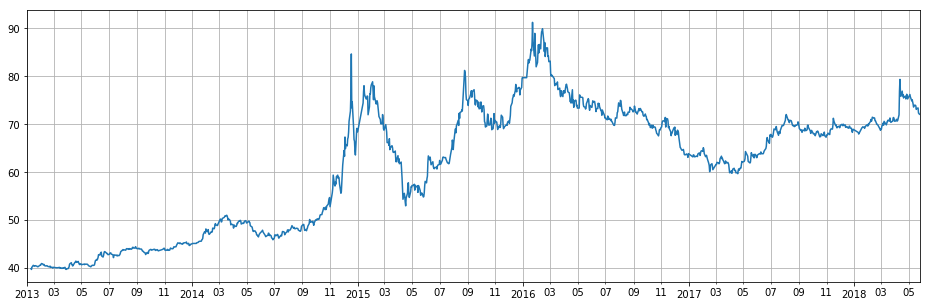

In [134]:
figure(figsize=(16,5))
ax = subplot()
grid(True, which='both')
xlim(map(matplotlib.dates.date2num, [startdate, enddate]))
locator_y = matplotlib.dates.YearLocator()
locator_m = matplotlib.dates.MonthLocator(bymonth=range(3, 11+1, 2))
formatter_y = matplotlib.dates.DateFormatter('%Y')
formatter_m = matplotlib.dates.DateFormatter('%m')
ax.xaxis.set_major_locator(locator_y)
ax.xaxis.set_major_formatter(formatter_y)
ax.xaxis.set_minor_locator(locator_m)
ax.xaxis.set_minor_formatter(formatter_m)
plot(matplotlib.dates.date2num(map(dateutil.parser.parse, df['DATE'])), df['CLOSE']);

Двумерную функцию можно табулировать (рассчитать в каждой точке сетки) и отобразить `imshow`.

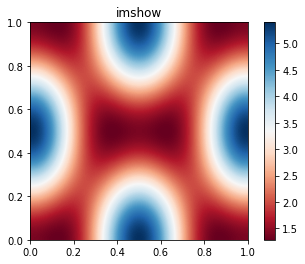

In [201]:
alpha = 0.7
phi_ext = 2 * pi * 0.5

def flux_qubit_potential(phi_m, phi_p):
    return 2 + alpha - 2 * cos(phi_p) * cos(phi_m) - alpha * cos(phi_ext - 2*phi_p)

phi_m = linspace(0, 2*pi, 100)
phi_p = linspace(0, 2*pi, 100)
X,Y = meshgrid(phi_p, phi_m)
Z = flux_qubit_potential(X, Y).T

title('imshow')
imshow(Z, cmap='RdBu', vmin=abs(Z).min(), vmax=abs(Z).max(), extent=[0, 1, 0, 1], interpolation='bilinear')
colorbar();

Схожий функционал реализует `pcolormesh`.

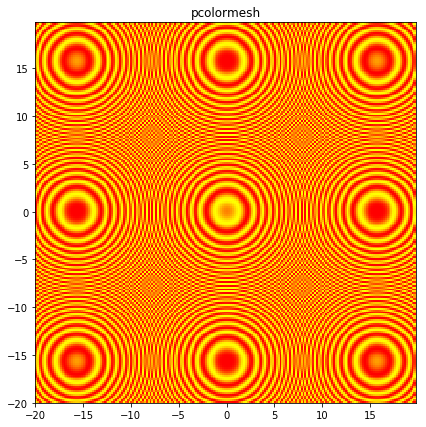

In [14]:
xx, yy = meshgrid(arange(-20, 20, 0.2), arange(-20, 20, 0.2))
zz = sin(xx**2 + yy**2)

figure(figsize=(7, 7))
title('pcolormesh')
axes().set_aspect('equal')
pcolormesh(xx, yy, zz, cmap='autumn');

Для отображения только изолиний подходит `contour`.

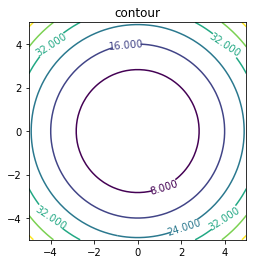

In [13]:
xx, yy = meshgrid(linspace(-5, 5), linspace(-5, 5))
zz = xx ** 2 + yy ** 2

title('contour')
axes().set_aspect('equal')
cs = contour(xx, yy, zz)
clabel(cs);

Визуализация векторного поля `streamplot`.

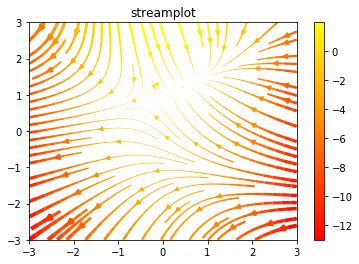

In [235]:
X, Y = meshgrid(linspace(-3, 3), linspace(-3, 3))
U = -1 - X**2 + Y
V = 1 + X - Y**2
speed = sqrt(U*U + V*V)
lw = 5*speed / speed.max()

title('streamplot')
streamplot(X, Y, U, V, color=U, linewidth=lw, cmap=cm.autumn)
colorbar();

Столбцы произвольной природы можно отобразить `bar` и `barh`.

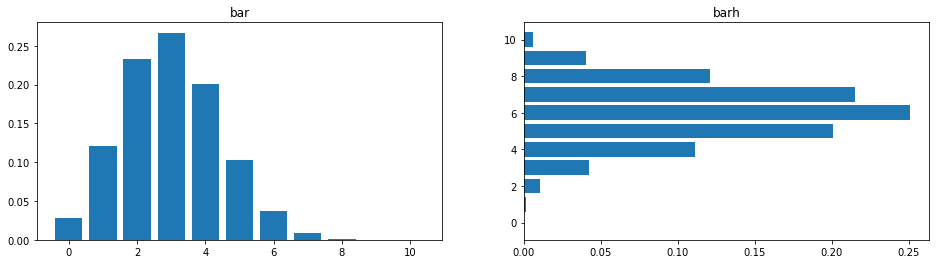

In [211]:
import scipy.special

n = 10
xx = arange(0, n + 1)

figure(figsize=(16,4))
subplot(121)
title('bar')
p = 0.3
yy = scipy.special.binom(n, xx) * p ** xx * (1 - p) ** (n - xx)
bar(xx, yy);

subplot(122)
title('barh')
p = 0.6
yy = scipy.special.binom(n, xx) * p ** xx * (1 - p) ** (n - xx)
barh(xx, yy);

Один вид часто встречающегося графика намеренно исключен отсюда. Пожалуйста, не используйте его. Никогда.

Для просмотра плотности распределения можно использовать `hist`, `step`, `seaborn.distplot`, `seaborn.kdeplot`.

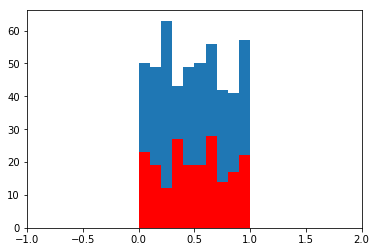

In [129]:
seed(0)
xlim(-1, 2)
hist(random.random((500,1)), bins=30, range=(-1, 2))
hist(random.random((200,1)), bins=30, range=(-1, 2), color='r');

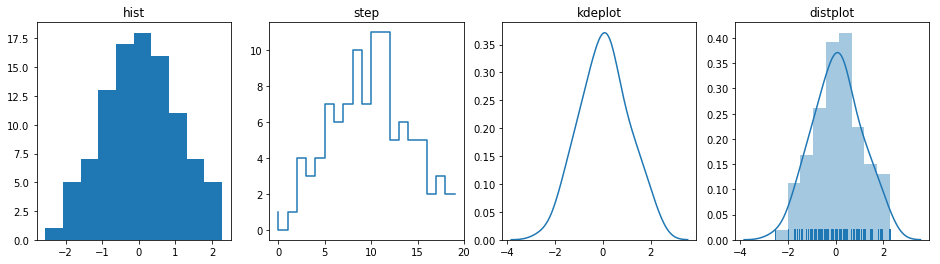

In [191]:
seed(0)
rnd_dist = randn(100)

figure(figsize=(16,4))

subplot(1, 4, 1)
title('hist')
hist(rnd_dist)

subplot(1, 4, 2)
title('step')
data, _ = histogram(rnd_dist, bins=20)
step(range(len(data)), data)

subplot(1, 4, 3)
title('kdeplot')
seaborn.kdeplot(rnd_dist)

subplot(1, 4, 4)
title('distplot')
seaborn.distplot(rnd_dist, rug=True);

Функция `kdeplot` умеет рисовать и плотности двухмерных выборок.

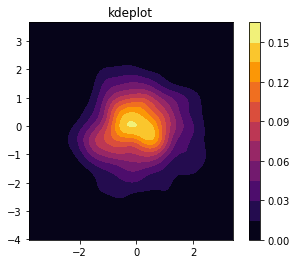

In [236]:
seed(0)
X, Y = randn(2, 300)
title('kdeplot')
seaborn.kdeplot(X, Y, cmap='inferno', shade=True, cbar=True)
gca().set_aspect('equal');

Посмотреть на двухмерную выборку можно и через `seaborn.jointplot`. Он создает свою `figure`, так что их нельзя так просто взять и сунуть в `subplot`.

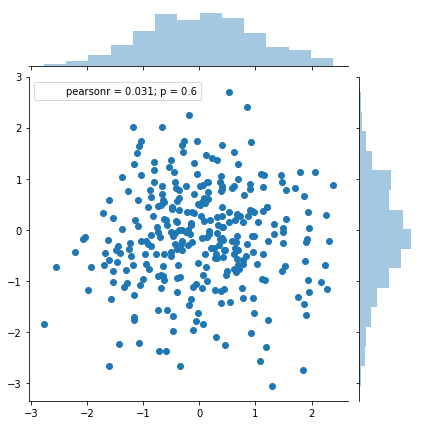

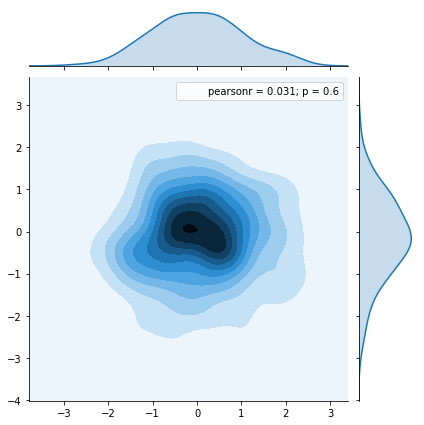

In [203]:
seaborn.jointplot(X, Y);
seaborn.jointplot(X, Y, kind='kde');

Для сравнения нескольких распределений служат «ящики с усами» `boxplot`, «скрипки» `violinplot`, облака точек `seaborn.stripplot`, облака неперекрывающихся точек `seaborn.swarmplot`.

Хотя `seaborn` умеет принимать массивы X и Y, но предпочитает `pandas.DataFrame` в аргумент `data=`, а `x=` и `y=` задают используемые колонки.

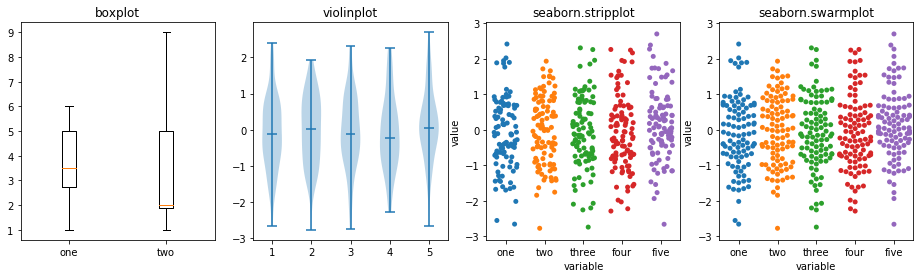

In [10]:
figure(figsize=(16,4))

subplot(1, 4, 1)
title('boxplot')
boxplot([[1.,2.,3.,3.,4.,5.,5.,6.], [1.,1.5,2.,2.,2.,4.,8.,9.]]);
xticks([1,2], ['one', 'two']);

subplot(1, 4, 2)
title('violinplot')
seed(0)
X = randn(100,5)
violinplot(X, showmedians=True);

subplot(1, 4, 3)
title('seaborn.stripplot')
df = pandas.DataFrame(X, columns='one two three four five'.split()).melt()
seaborn.stripplot(x='variable', y='value', data=df, jitter=0.3);

subplot(1, 4, 4)
title('seaborn.swarmplot')
seaborn.swarmplot(x='variable', y='value', data=df);

Функция `seaborn.pairplot` рисует сразу много графиков, иллюстрируя попарные связи между колонками в `pandas.DataFrame` с данными.

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


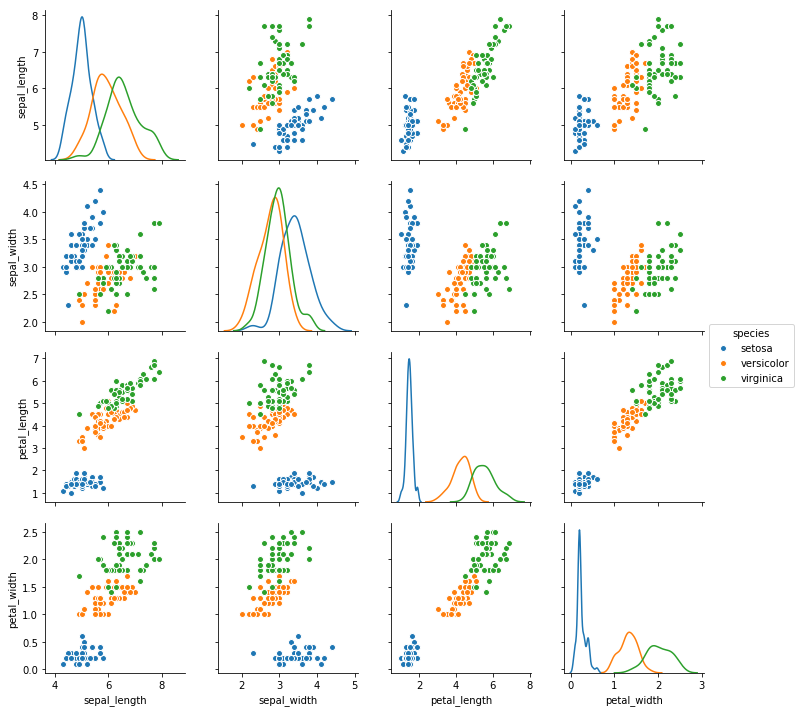

In [11]:
df = seaborn.load_dataset('iris')
display(df.head())
seaborn.pairplot(df, hue='species', diag_kind='kde');

Чтобы нанести черточки экспериментальных ошибок, вместо `scatter` можно использовать `errorbar`.

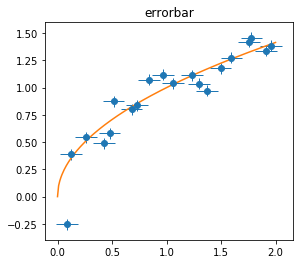

In [231]:
seed(0)
xx = linspace(0, 2, 20)
yy = xx ** 0.5
title('errorbar')
gca().set_aspect('equal')
errorbar(xx + 0.05 * randn(*xx.shape), yy + 0.1 * randn(*yy.shape), 0.05, 0.1, 'o', lw=1)
xx = linspace(0, 2, 200)
yy = xx ** 0.5
plot(xx, yy);

Квартет Анскомба фитить прямыми нехорошо и `seaborn.regplot` показывает насколько.

,dataset,x,y
11,II,10.0,9.14
12,II,8.0,8.14
13,II,13.0,8.74
14,II,9.0,8.77
15,II,11.0,9.26


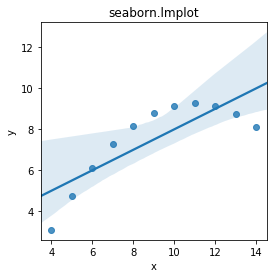

In [29]:
df = seaborn.load_dataset('anscombe')
df = df[df.dataset == 'II']
display(df.head())

ax = seaborn.regplot(x='x', y='y', data=df)
ax.set_title('seaborn.lmplot')
ax.set_aspect('equal')

Эволюцию объема и долей часто отображают `stackplot`.

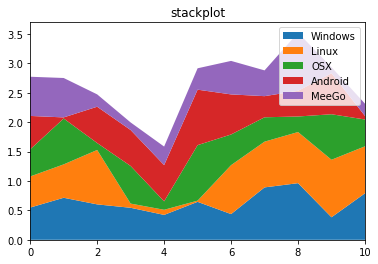

In [315]:
seed(0)
xlim([0,10])
title('stackplot')
stackplot(range(11), abs(rand(5, 11)), labels='Windows Linux OSX Android MeeGo'.split())
legend();

In [432]:
seed(0)
X = rand(10,10)

Интенсивности на 2D сетке изображают `seaborn.heatmap`.

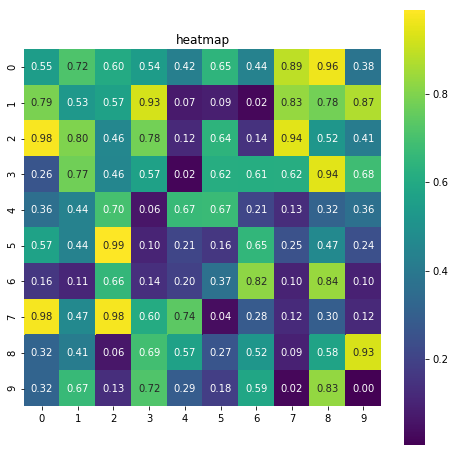

In [433]:
figure(figsize=(8,8))
title('heatmap')
seaborn.heatmap(X, fmt='.2f', annot=True, square=True, cmap='viridis');

Схожий результат дает `imshow` с `interpolation='None'`. Параметры `extent=` и `aspect=` позволяют настраивать масштабы осей.

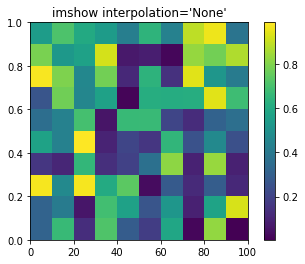

In [434]:
title('imshow interpolation=\'None\'')
imshow(X, interpolation='None',  extent=[0,100,0,1], aspect=100)
colorbar();

todo
* http://seaborn.pydata.org/generated/seaborn.factorplot.html factorplot, col, hue
* http://seaborn.pydata.org/generated/seaborn.clustermap.html
* http://seaborn.pydata.org/examples/structured_heatmap.html
* http://seaborn.pydata.org/generated/seaborn.countplot.html

## 3D-графики

In [2]:
from mpl_toolkits.mplot3d import axes3d

In [167]:
X, Y, Z = axes3d.get_test_data(0.1)
print X.shape, Y.shape, Z.shape

(60L, 60L) (60L, 60L) (60L, 60L)


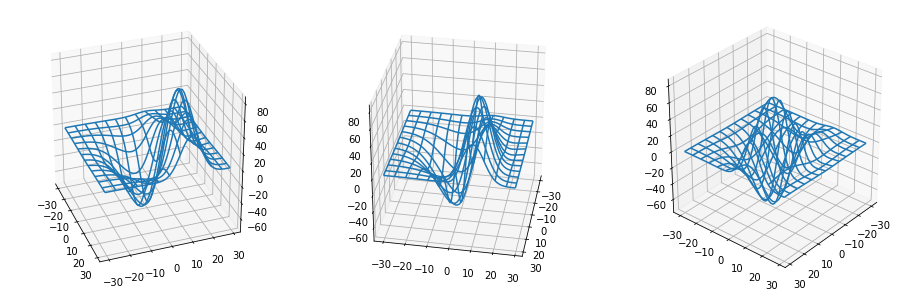

In [122]:
fig = figure(figsize=(16,5))
for i in range(3):
    ax = fig.add_subplot(1, 3, i + 1, projection='3d') # или gca(projection='3d')
    ax.plot_wireframe(X, Y, Z, rstride=5, cstride=5)
    ax.view_init(elev=30, azim=-20 + 30 * i)

IPython поддерживает несколько бэкендов отображения графиков — `inline` в `%pylab inline` означает именно это. Если для 2D графиков дефолтное поведение (вставить картинкой) удобно, для 3D может понадобиться другое. Полезнее всего `gui='notebook'`, который вставляет график в нотебук, позволяет его вращать, а потом выключить, превратив в картинку.

In [118]:
IPython.core.pylabtools.backends

{'gtk': 'GTKAgg',
 'gtk3': 'GTK3Agg',
 'inline': 'module://ipykernel.pylab.backend_inline',
 'nbagg': 'nbAgg',
 'notebook': 'nbAgg',
 'osx': 'MacOSX',
 'qt': 'Qt4Agg',
 'qt4': 'Qt4Agg',
 'qt5': 'Qt5Agg',
 'tk': 'TkAgg',
 'wx': 'WXAgg'}

In [153]:
get_ipython().enable_matplotlib(gui='notebook')

('notebook', 'nbAgg')

<IPython.core.display.Javascript object>


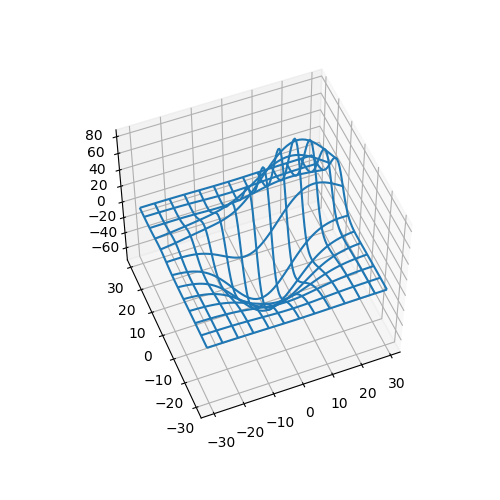

In [154]:
figure(figsize=(5,5))
ax = subplot(111, projection='3d')
ax.plot_wireframe(X, Y, Z, rstride=5, cstride=5)
ax.view_init(elev=30, azim=-20);

In [155]:
get_ipython().enable_matplotlib(gui='inline')

('inline', 'module://ipykernel.pylab.backend_inline')

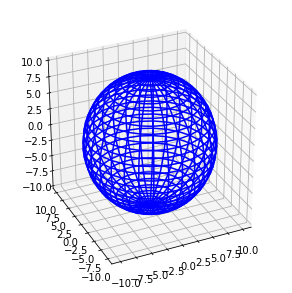

In [198]:
fig = figure(figsize=(8,5))
ax = fig.add_subplot(111, projection='3d')

u = linspace(0, 2 * pi, 30)
v = linspace(0, pi, 30)
x = 10 * outer(cos(u), sin(v))
y = 10 * outer(sin(u), sin(v))
z = 10 * outer(ones(size(u)), cos(v))

ax.plot_wireframe(x, y, z, color='b')
ax.set_aspect('equal')
ax.view_init(30,245)

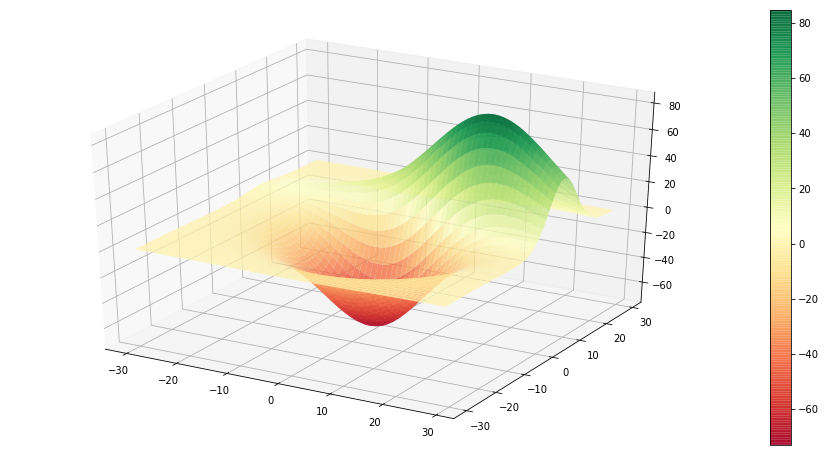

In [158]:
fig = figure(figsize=(16, 8))
ax = fig.add_subplot(111, projection='3d')
p = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, linewidth=0, antialiased=True, alpha=0.8, cmap='RdYlGn')
colorbar(p, ax=ax);

In [3]:
X, Y = meshgrid(arange(-6, 6, 0.25), arange(-6, 6, 0.25))
Z = sin(sqrt(X**2 + Y**2))

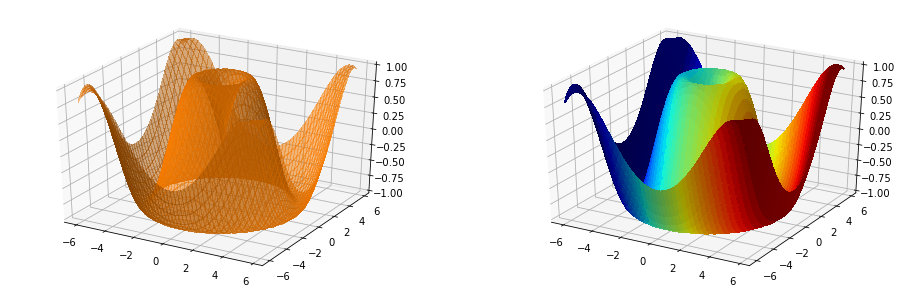

In [290]:
fig = figure(figsize=(16,5))
ax = fig.add_subplot(121, projection='3d')
surf = ax.plot_surface(X, Y, Z, color=(1,0.5,0), rstride=1, cstride=1, antialiased=False, alpha=0.5)
ax.set_zlim(-1, 1)

ax = fig.add_subplot(122, projection='3d')
surf = ax.plot_surface(X, Y, Z, facecolors=cm.jet((X+5)/10), rstride=1, cstride=1, antialiased=False)
ax.set_zlim(-1, 1);

Этот график в простонародьи называется «потолочный лампооблизыватель».

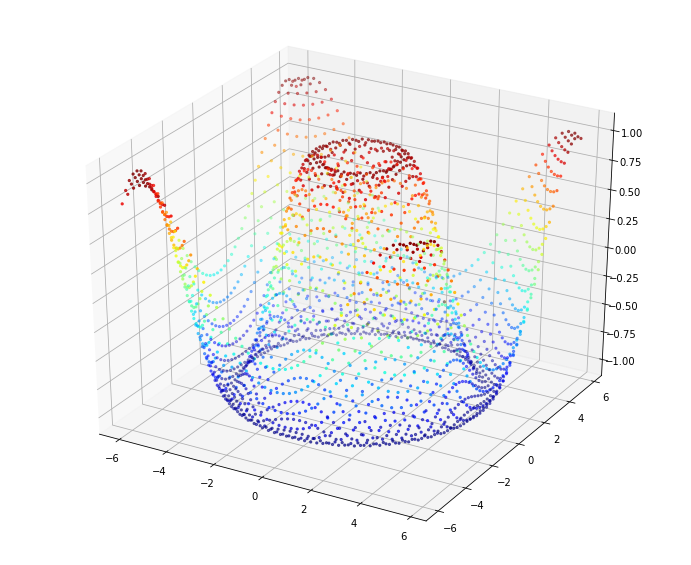

In [4]:
figure(figsize=(12,10))
ax = subplot(111, projection='3d')
ax.scatter(X, Y, Z, c=Z, cmap='jet', marker='.');

## Анимация

todo смоделировать https://twitter.com/fermatslibrary/status/838392423063687168 ?

https://matplotlib.org/gallery/animation/random_walk.html Animated 3D random walk

https://matplotlib.org/api/animation_api.html#writer-classes

(60L, 60L) (60L, 60L) (60L, 60L)


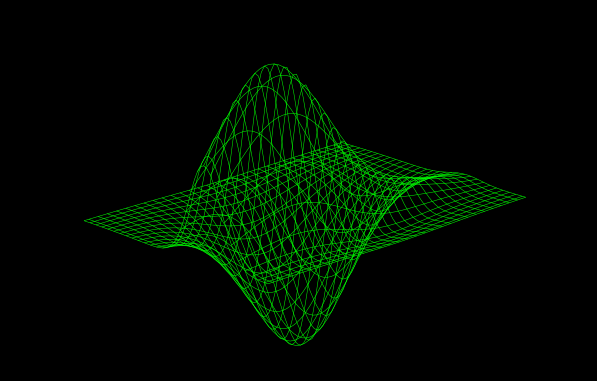

In [474]:
X, Y, Z = axes3d.get_test_data(0.1)
print X.shape, Y.shape, Z.shape

fig = figure(figsize=(8,5), facecolor='black')
ax = fig.add_axes([0, 0, 1, 1], projection='3d')
ax.axis('off')
ax.set_xlim((-25, 25))
ax.set_ylim((-35, 35))
ax.set_zlim((-30, 55))
gfx = ax.plot_wireframe(X, Y, Z, color='#00FF00', linewidth=0.5);
ax.set_facecolor('black')
ax.view_init(elev=30, azim=45)

def update(frame):
    ax.view_init(elev=30, azim=45+frame)
    return gfx,

anima = matplotlib.animation.FuncAnimation(fig, update, interval=10, blit=True, frames=200)

In [475]:
gfx.set_

In [463]:
gfx

In [ ]:
gfx.set_da

blit=True means only re-draw the parts that have changed

In [473]:
xx = linspace(-5, 5)

fig = figure()
ax = fig.add_axes([0,0,1,1])
ax.set_xlim(-5,5)
ax.set_ylim(-1,1)
gfx, = plot(xx, sin(xx))

def update(frame):
    gfx.set_color(cm.viridis(sin(2 * pi * frame / 100.)))
    gfx.set_data(xx, sin(2 * pi * frame / 100.) * sin(xx))
    return gfx,

anim = matplotlib.animation.FuncAnimation(fig, update, interval=10, blit=True, frames=100)
close()
anim

todo

In [293]:
import matplotlib.animation

In [476]:
n = 50
size_min = 50
size_max = 50*50

# Ring position
P = np.random.uniform(0,1,(n,2))

# Ring colors
C = np.ones((n,4)) * (0,0,0,1)
# Alpha color channel goes from 0 (transparent) to 1 (opaque)
C[:,3] = np.linspace(0,1,n)

# Ring sizes
S = np.linspace(size_min, size_max, n)

# Scatter plot
fig = figure(figsize=(8,5))
ax = fig.add_axes([0,0,1,1])
scat = ax.scatter(P[:,0], P[:,1], s=S, lw = 0.5,
                  edgecolors = C, facecolors='None')

# Ensure limits are [0,1] and remove ticks
ax.set_xlim(0,1), ax.set_xticks([])
ax.set_ylim(0,1), ax.set_yticks([])

def update(frame):
    global P, C, S

    # Every ring is made more transparent
    C[:,3] = np.maximum(0, C[:,3] - 1.0/n)

    # Each ring is made larger
    S += (size_max - size_min) / n

    # Reset ring specific ring (relative to frame number)
    i = frame % 50
    P[i] = np.random.uniform(0,1,2)
    S[i] = size_min
    C[i,3] = 1

    # Update scatter object
    scat.set_edgecolors(C)
    scat.set_sizes(S)
    scat.set_offsets(P)

    # Return the modified object
    return scat,

animation = matplotlib.animation.FuncAnimation(fig, update, interval=10, blit=True, frames=200)
animation.save('rain.gif', writer='imagemagick', fps=30, dpi=40)
animation.save('rain.mp4', fps=30, extra_args=['-vcodec', 'libx264'])
close()
animation

In [298]:
rc('animation', html='html5')
#plt.rcParams["animation.html"] = "jshtml"

In [458]:
import scipy.integrate as integrate
import matplotlib.animation as animation

class DoublePendulum:
    """Double Pendulum Class

    init_state is [theta1, omega1, theta2, omega2] in degrees,
    where theta1, omega1 is the angular position and velocity of the first
    pendulum arm, and theta2, omega2 is that of the second pendulum arm
    """
    def __init__(self,
                 init_state = [120, 0, -20, 0],
                 L1=1.0,  # length of pendulum 1 in m
                 L2=1.0,  # length of pendulum 2 in m
                 M1=1.0,  # mass of pendulum 1 in kg
                 M2=1.0,  # mass of pendulum 2 in kg
                 G=9.8,  # acceleration due to gravity, in m/s^2
                 origin=(0, 0)): 
        self.init_state = np.asarray(init_state, dtype='float')
        self.params = (L1, L2, M1, M2, G)
        self.origin = origin
        self.time_elapsed = 0

        self.state = self.init_state * np.pi / 180.
    
    def position(self):
        """compute the current x,y positions of the pendulum arms"""
        (L1, L2, M1, M2, G) = self.params

        x = np.cumsum([self.origin[0],
                       L1 * sin(self.state[0]),
                       L2 * sin(self.state[2])])
        y = np.cumsum([self.origin[1],
                       -L1 * cos(self.state[0]),
                       -L2 * cos(self.state[2])])
        return (x, y)

    def energy(self):
        """compute the energy of the current state"""
        (L1, L2, M1, M2, G) = self.params

        x = np.cumsum([L1 * sin(self.state[0]),
                       L2 * sin(self.state[2])])
        y = np.cumsum([-L1 * cos(self.state[0]),
                       -L2 * cos(self.state[2])])
        vx = np.cumsum([L1 * self.state[1] * cos(self.state[0]),
                        L2 * self.state[3] * cos(self.state[2])])
        vy = np.cumsum([L1 * self.state[1] * sin(self.state[0]),
                        L2 * self.state[3] * sin(self.state[2])])

        U = G * (M1 * y[0] + M2 * y[1])
        K = 0.5 * (M1 * np.dot(vx, vx) + M2 * np.dot(vy, vy))

        return U + K

    def dstate_dt(self, state, t):
        """compute the derivative of the given state"""
        (M1, M2, L1, L2, G) = self.params

        dydx = np.zeros_like(state)
        dydx[0] = state[1]
        dydx[2] = state[3]

        cos_delta = cos(state[2] - state[0])
        sin_delta = sin(state[2] - state[0])

        den1 = (M1 + M2) * L1 - M2 * L1 * cos_delta * cos_delta
        dydx[1] = (M2 * L1 * state[1] * state[1] * sin_delta * cos_delta
                   + M2 * G * sin(state[2]) * cos_delta
                   + M2 * L2 * state[3] * state[3] * sin_delta
                   - (M1 + M2) * G * sin(state[0])) / den1

        den2 = (L2 / L1) * den1
        dydx[3] = (-M2 * L2 * state[3] * state[3] * sin_delta * cos_delta
                   + (M1 + M2) * G * sin(state[0]) * cos_delta
                   - (M1 + M2) * L1 * state[1] * state[1] * sin_delta
                   - (M1 + M2) * G * sin(state[2])) / den2
        
        return dydx

    def step(self, dt):
        """execute one time step of length dt and update state"""
        self.state = integrate.odeint(self.dstate_dt, self.state, [0, dt])[1]
        self.time_elapsed += dt

#------------------------------------------------------------
# set up initial state and global variables
pendulum = DoublePendulum([180., 0.0, -20., 0.0])
dt = 1./30 # 30 fps

#------------------------------------------------------------
# set up figure and animation
fig = plt.figure()
ax = fig.add_subplot(111, aspect='equal', autoscale_on=False, xlim=(-2, 2), ylim=(-2, 2))
ax.grid()

line, = ax.plot([], [], 'o-', lw=2)
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)
energy_text = ax.text(0.02, 0.90, '', transform=ax.transAxes)

def init():
    """initialize animation"""
    line.set_data([], [])
    time_text.set_text('')
    energy_text.set_text('')
    return line, time_text, energy_text

def animate(i):
    """perform animation step"""
    global pendulum, dt
    pendulum.step(dt)
    
    line.set_data(*pendulum.position())
    time_text.set_text('time = %.1f' % pendulum.time_elapsed)
    energy_text.set_text('energy = %.3f J' % pendulum.energy())
    return line, time_text, energy_text

# choose the interval based on dt and the time to animate one step
from time import time
t0 = time()
animate(0)
t1 = time()
interval = 1000 * dt - (t1 - t0)

ani = animation.FuncAnimation(fig, animate, frames=300, interval=interval, blit=True, init_func=init)

ani.save('double_pendulum.mp4', fps=30, extra_args=['-vcodec', 'libx264'])
close()
ani

## Необычные графики

Облако слов может нарисовать библиотека `wordcloud`.

```
pip install wordcloud
```

In [51]:
import nltk.corpus
from collections import Counter

alice = nltk.corpus.gutenberg.raw('carroll-alice.txt')
words = Counter(nltk.tokenize.word_tokenize(alice))
clean_words = {k:v for k,v in words.items() if k.lower() not in wordcloud.STOPWORDS and k.isalpha()}
print len(alice), len(words), len(clean_words)

144395 3189 2498


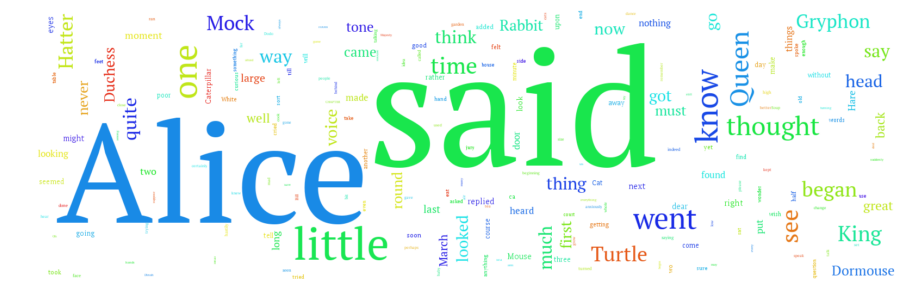

In [54]:
import wordcloud

cloud = wordcloud.WordCloud(
    font_path='C:\\Windows\\Fonts\\PT_Serif-Web-Regular.ttf',
    width=1600, height=500, background_color='white', 
    max_words=200, relative_scaling=1,
    color_func=wordcloud.random_color_func,
    prefer_horizontal=0.6,
    normalize_plurals=False)
cloud.generate_from_frequencies(clean_words)

figure(figsize=(16,5))
imshow(cloud, interpolation="bilinear")
axis('off');

Treemap может нарисовать модуль `statsmodels.graphics.mosaicplot`. Библиотека `statsmodels` входит в Anaconda.

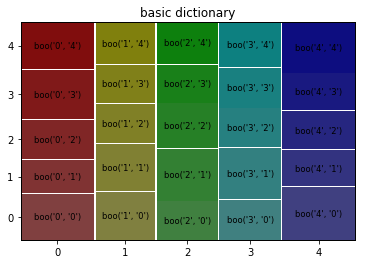

In [222]:
import statsmodels.graphics.mosaicplot
seed(0)
data = abs(random.randn(5,5))
data += data.max() + 1
statsmodels.graphics.mosaicplot.mosaic(data, labelizer=lambda x:'boo' + str(x), title='basic dictionary');

Sankey diagram есть в модуле `matplotlib.sankey`.

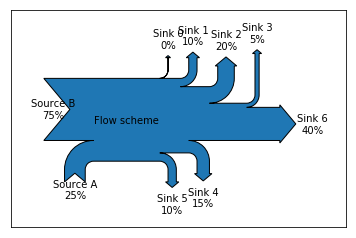

In [31]:
from matplotlib.sankey import Sankey

sankey = Sankey(scale=0.01, offset=0.2, format='%.0f', unit='%')
sankey.add(
    flows=[25, 0, 75, -10, -20, -5, -15, -10, -40],
    labels=['Source A', 'Sink 0', 'Source B', 'Sink 1', 'Sink 2', 'Sink 3', 'Sink 4', 'Sink 5', 'Sink 6'],
    orientations=[-1, 1, 0, 1, 1, 1, -1, -1, 0],
    pathlengths=[0.25, 0.25, 0.25, 0.25, 0.25, 0.6, 0.25, 0.25, 0.25],
    patchlabel="Flow scheme"
)
sankey.finish();

Диаграммы Венна с площадями соответствующих размеров на 2 или 3 множества можно нарисовать библиотекой `matplotlib-venn`.

```
pip install matplotlib-venn
```

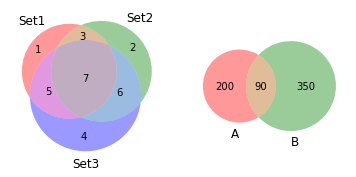

In [148]:
import matplotlib_venn
subplot(121)
matplotlib_venn.venn3(subsets=(1, 2, 3, 4, 5, 6, 7), set_labels=('Set1', 'Set2', 'Set3'));
subplot(122)
matplotlib_venn.venn2(subsets=(200, 350, 90));

## Стили и цвета

Вызов `xkcd()` модифицирует `rcParams` так, чтобы сделать графики похожими на стиль комикса Рэндалла Мунро. Вернуть `rcdefaults()`

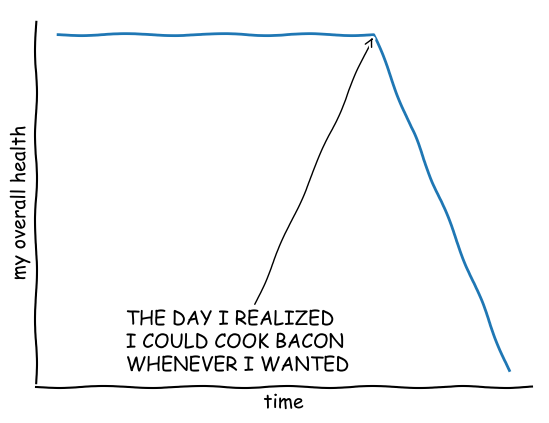

In [297]:
xx = [0, 70, 100]
yy = [1, 1, 0]

with xkcd():
    axes().spines['right'].set_color('none')
    axes().spines['top'].set_color('none')
    annotate(
        'THE DAY I REALIZED\nI COULD COOK BACON\nWHENEVER I WANTED',
        xy=(70, 1), arrowprops=dict(arrowstyle='->'), xytext=(15, 0)
    )
    xticks([]); yticks([])
    xlabel('time')
    ylabel('my overall health')
    plot(xx, yy);

Библиотека `matplotlib` содержит большое количество цветовых схем, разработанных с учетом многих особенностей психофизиологии зрения. Для каждой есть обращенная с суффиксом `_r`.

In [2]:
print len(colormaps())
print ' '.join(colormaps())

168
Accent Accent_r Blues Blues_r BrBG BrBG_r BuGn BuGn_r BuPu BuPu_r CMRmap CMRmap_r Dark2 Dark2_r GnBu GnBu_r Greens Greens_r Greys Greys_r OrRd OrRd_r Oranges Oranges_r PRGn PRGn_r Paired Paired_r Pastel1 Pastel1_r Pastel2 Pastel2_r PiYG PiYG_r PuBu PuBuGn PuBuGn_r PuBu_r PuOr PuOr_r PuRd PuRd_r Purples Purples_r RdBu RdBu_r RdGy RdGy_r RdPu RdPu_r RdYlBu RdYlBu_r RdYlGn RdYlGn_r Reds Reds_r Set1 Set1_r Set2 Set2_r Set3 Set3_r Spectral Spectral_r Vega10 Vega10_r Vega20 Vega20_r Vega20b Vega20b_r Vega20c Vega20c_r Wistia Wistia_r YlGn YlGnBu YlGnBu_r YlGn_r YlOrBr YlOrBr_r YlOrRd YlOrRd_r afmhot afmhot_r autumn autumn_r binary binary_r bone bone_r brg brg_r bwr bwr_r cool cool_r coolwarm coolwarm_r copper copper_r cubehelix cubehelix_r flag flag_r gist_earth gist_earth_r gist_gray gist_gray_r gist_heat gist_heat_r gist_ncar gist_ncar_r gist_rainbow gist_rainbow_r gist_stern gist_stern_r gist_yarg gist_yarg_r gnuplot gnuplot2 gnuplot2_r gnuplot_r gray gray_r hot hot_r hsv hsv_r infern

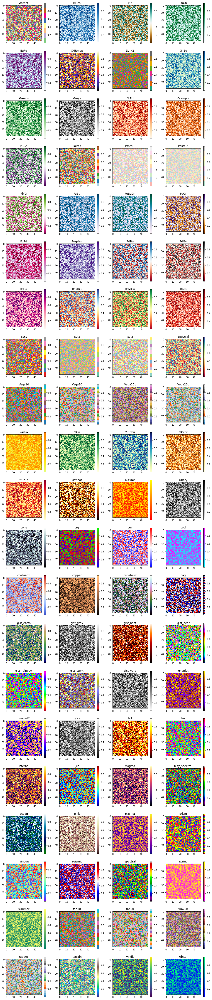

In [27]:
data = random.random((50,50))
figure(figsize=(16,80))
for i, cmap in enumerate([item for item in colormaps() if not item.endswith('_r')]):
    subplot(21, 4, i + 1)
    title(cmap)
    imshow(data, interpolation='None', cmap=cmap)
    colorbar();

Или смотрите картинки здесь https://matplotlib.org/users/colormaps.html . Чаще других встречаются `Greys_r`, `RdYlGn_r`, `Spectral`, `coolwarm`, `gray`, `hot`, `inferno`, `jet`, `viridis`.

Если этих палитр покажется мало, библиотека `palettable` https://jiffyclub.github.io/palettable/#finding-palettes содежит еще.

## Карты

Для отображения карт и связанной с ними информации используют библиотеку `basemap`, работающую поверх `matplotlib`.

```
conda install basemap
```

In [41]:
import mpl_toolkits.basemap
from mpl_toolkits.basemap import Basemap
len(mpl_toolkits.basemap.supported_projections.splitlines())

34

Поэстетствовать на проекции можно по ссылке https://matplotlib.org/basemap/users/mapsetup.html . Советские атласы использовали обычно проекцию Каврайского (`kav7`). Из соображений гламурности широты обрезают на 74 градусах, а центр карты сдвигают с Гринвичского меридиана на 11 градусов восточной долготы, чтобы Берингов пролив был по краям карты.

In [42]:
SEA = '#E7FFF8'
LAND = '#C0C0C0'
LAKE = '#8ADDD8'
COAST = '#4D617C'
BORDER = 'w'

In [43]:
matplotlib.warnings.filterwarnings('ignore')

Оператор `()` у объекта `Basemap` преобразовывает координаты из долготы-широты в координатную систему графика (с `inverse=True` в обратную сторону), что позволяет рисовать обычными вызовами `matplotlib` там, где надо.

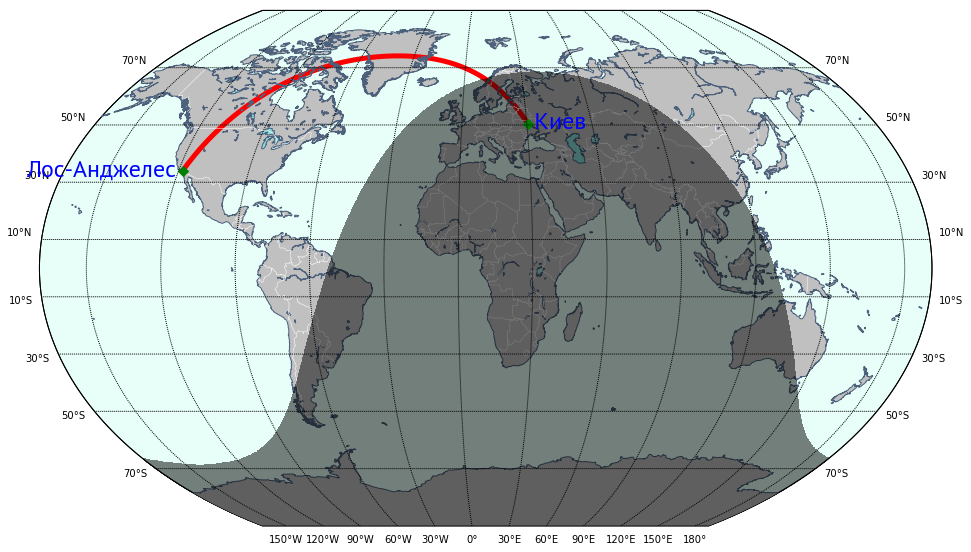

In [575]:
date = datetime.datetime.utcnow()
lon_lat_coords = array([[30.5234, 50.4501], [-118.2437, 34.0522]])

figure(figsize=(16,12))

m = Basemap(llcrnrlon=-180., llcrnrlat=-74., urcrnrlon=180., urcrnrlat=74.,
            resolution='l', projection='kav7',
            lat_0=0., lon_0=11.)

m.drawcoastlines(color=COAST)
m.drawcountries(color=BORDER)
m.drawmapboundary(fill_color=SEA)
m.fillcontinents(color=LAND, lake_color=LAKE)
m.nightshade(date)
m.drawparallels(arange(-90,90,20), labels=[1,1,0,1])
m.drawmeridians(arange(-180,180,30), labels=[1,1,0,1])

map_x, map_y = m(lon_lat_coords[:,0], lon_lat_coords[:,1])
m.scatter(map_x, map_y, marker='D', c='g', s=50, zorder=2);
text(map_x[0], map_y[0], u' Киев', fontsize=24, fontname='PT Sans', ha='left', va='center', color='b')
text(map_x[1], map_y[1], u'Лос-Анджелес ', fontsize=24, fontname='PT Sans', ha='right', va='center', color='b')

m.drawgreatcircle(
    lon_lat_coords[0][0], lon_lat_coords[0][1], lon_lat_coords[1][0], lon_lat_coords[1][1], c='r', lw=5, zorder=1);

Параметр `resolution` принимает одно из значений `crude low intermediate high full` (можно использовать только первую букву). Разрешение `full` нужно качать отдельно.

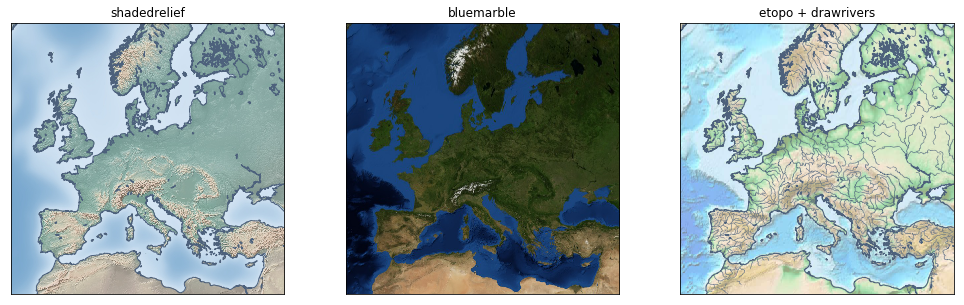

In [550]:
figure(figsize=(17,5))
subplot(131)
title('shadedrelief')
m = Basemap(llcrnrlon=-15., llcrnrlat=30., urcrnrlon=40., urcrnrlat=65.,
            rsphere=(6378137.00, 6356752.3142),
            resolution='i', projection='merc')
m.shadedrelief()
m.drawcoastlines(color=COAST);

subplot(132)
title('bluemarble')
m = Basemap(llcrnrlon=-15., llcrnrlat=30., urcrnrlon=40., urcrnrlat=65.,
            rsphere=(6378137.00, 6356752.3142),
            resolution='i', projection='merc')
m.bluemarble()

subplot(133)
title('etopo + drawrivers')
m = Basemap(llcrnrlon=-15., llcrnrlat=30., urcrnrlon=40., urcrnrlat=65.,
            rsphere=(6378137.00, 6356752.3142),
            resolution='i', projection='merc')
m.etopo(scale=0.5, alpha=0.5)
m.drawcoastlines(color=COAST)
m.drawrivers(color=COAST);

В то время как линии побережий и озер включены в `basemap`, свежие политические границы уже приходится качать из интернетов в формате shapefile, например, с http://www.naturalearthdata.com/downloads/ , где есть еще и координаты городов, аэропортов и транспортных линий. Для работы с shapefile служит библиотека `pyshp`.

Другим источником информации о координатах всякого на поверхности Земли может служить http://download.geonames.org/export/dump/ .

```
pip install pyshp
```

In [36]:
import shapefile

In [37]:
r = shapefile.Reader(r"C:\Users\User\Downloads\ne_10m_admin_0_countries\ne_10m_admin_0_countries.shp")
print r.shapeType == shapefile.POLYGON
print len(r.shapes()), len(r.records()), len(r.records()[0]), len(r.fields)
print r.shapes()[0].points[:10], r.shapes()[0].parts[:10]

field_names = [descr[0] for descr in r.fields[1:]]
shape_props = [dict(zip(field_names, record)) for record in r.records()]

True
255 255 94 95
[(117.70360790395524, 4.163414542001791), (117.70360790400008, 4.163414542000055), (117.73807146200011, 4.157241908000032), (117.78357224700005, 4.157241908000032), (117.85255730900013, 4.157241908000032), (117.9070390276059, 4.156683015004099), (117.91211998800009, 4.144924221000053), (117.91822350400003, 4.100043036000045), (117.93482506600003, 4.0598819030000755), (117.90137780000009, 4.0366885440000715)] array('i', [0, 17, 261, 2099, 4079, 4095, 4121, 4145, 4166, 4181])


В файле `ne_10m_admin_0_countries.shp` описаны административные единицы 255 списками полигонов (и 94 свойства для каждого). Каждый полигон состоит из нескольких замкнутых фигур, для которых даны вершины и интервалы их индексов, принадлежащие одной фигуре.

На сайте жуликов из World Bank можно скачать в формате CSV разные экономические показатели, например, считающийся показателем экономического благополучия GDP Per Capita, PPP (Current International $) http://databank.worldbank.org/data/reports.aspx?source=2&series=NY.GDP.PCAP.PP.CD

In [38]:
df = pandas.read_csv(r"C:\Users\User\Downloads\Data_Extract_From_World_Development_Indicators\9d654e6c-5034-4c26-9934-f0451267d040_Data.csv")
i_last_country = where((df['Country Name'] == 'Zimbabwe'))[0][0]
df = df[:i_last_country+1]
df = df.set_index('Country Code')
df = df.replace('..', nan)
df['2016 [YR2016]'] = df['2016 [YR2016]'].astype(float)
df.nlargest(20, ['2016 [YR2016]'])[['Country Name', '2016 [YR2016]']]

,Country Name,2016 [YR2016]
Country Code,,
QAT,Qatar,127480.482511
MAC,"Macao SAR, China",105420.414237
LUX,Luxembourg,102389.437728
SGP,Singapore,87832.586514
BRN,Brunei Darussalam,77420.612172
KWT,Kuwait,74263.998626
ARE,United Arab Emirates,72399.653473
IRL,Ireland,71472.295965
CHE,Switzerland,63888.732387


In [116]:
def read_patches(filename, m):
    r = shapefile.Reader(filename)
    field_names = [descr[0] for descr in r.fields[1:]]
    for record, shape in zip(r.records(), r.shapes()):
        points = array(shape.points)
        parts = list(shape.parts) + [len(shape.points)]
        patches = []
        for begin, end in zip(parts, parts[1:]):
            frag = points[begin:end]
            frag = array(m(*frag.T)).T
            patches.append(Polygon(frag, False))
        yield dict(zip(field_names, record)), patches

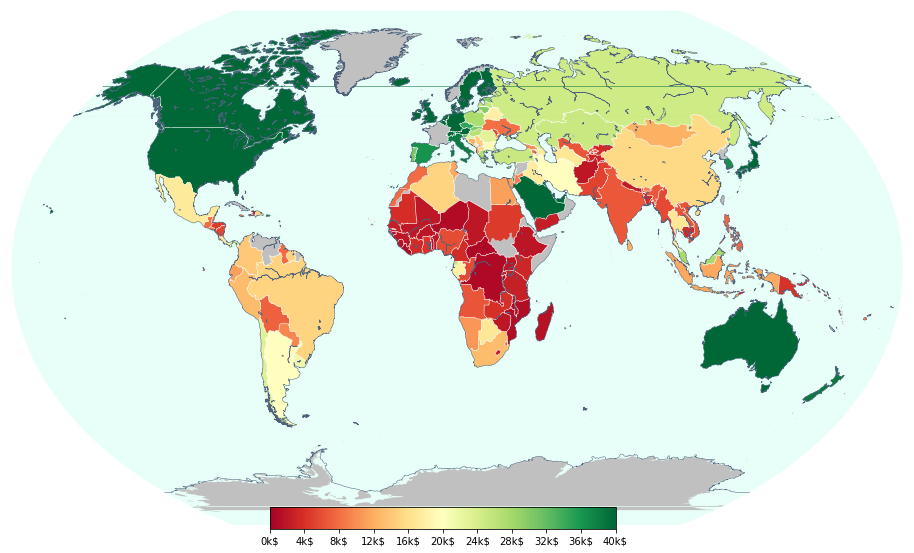

In [117]:
fig = figure(figsize=(16,10))
m = Basemap(resolution='l', projection='kav7', llcrnrlat=-74, urcrnrlat=74, llcrnrlon=-180, urcrnrlon=180, lon_0=11)
m.drawmapboundary(color='w', fill_color=SEA)
m.drawcountries(linewidth=0.5, color='w')
m.drawcoastlines(linewidth=0.5, color=COAST);

for info, patches in  read_patches(r"C:\Users\User\Downloads\ne_10m_admin_0_countries\ne_10m_admin_0_countries.shp", m):
    country = info['ISO_A3']
    gdp_ppp_pc = df['2016 [YR2016]'].get(country, nan)
    color = cm.RdYlGn(float(gdp_ppp_pc) / 40000) if not isnan(gdp_ppp_pc) else LAND
    pc = matplotlib.collections.PatchCollection(patches, facecolors=color, linewidths=0.1)
    gca().add_collection(pc)

ax = fig.add_axes([0.35, 0.14, 0.3, 0.03], zorder=3)
cb = mpl.colorbar.ColorbarBase(ax, cmap='RdYlGn', ticks=linspace(0,1,11), orientation='horizontal')
cb.set_ticklabels(map(lambda x: '%.0fk$' % x, linspace(0,40,11)));

При беглом сравнении береговых линий Антарктиды из устаревшей библиотеки `basemap` и современных shapefile становится очевидно, что никакого глобального потепления нет.

In [417]:
r = shapefile.Reader(r"C:\Users\User\Downloads\ne_10m_populated_places\ne_10m_populated_places.shp")
field_names = [descr[0] for descr in r.fields[1:]]
shape_props = [dict(zip(field_names, record)) for record in r.records()]
df = pandas.DataFrame(shape_props)
print list(df.columns)
df[['name_ru', 'POP_MAX', 'LATITUDE', 'LONGITUDE']].nlargest(20, 'POP_MAX')

['ADM0CAP', 'ADM0NAME', 'ADM0_A3', 'ADM1NAME', 'ADMIN1_COD', 'CAPALT', 'CAPIN', 'CHANGED', 'CHECKME', 'CITYALT', 'COMPARE', 'DIFFASCII', 'DIFFNOTE', 'ELEVATION', 'FEATURECLA', 'FEATURE_CL', 'FEATURE_CO', 'GEONAMEID', 'GEONAMESNO', 'GN_ASCII', 'GN_POP', 'GTOPO30', 'ISO_A2', 'LABELRANK', 'LATITUDE', 'LONGITUDE', 'LS_MATCH', 'LS_NAME', 'MAX_AREAKM', 'MAX_AREAMI', 'MAX_BBXMAX', 'MAX_BBXMIN', 'MAX_BBYMAX', 'MAX_BBYMIN', 'MAX_NATSCA', 'MAX_PERKM', 'MAX_PERMI', 'MAX_POP10', 'MAX_POP20', 'MAX_POP300', 'MAX_POP310', 'MAX_POP50', 'MEAN_BBXC', 'MEAN_BBYC', 'MEGACITY', 'MEGANAME', 'MIN_AREAKM', 'MIN_AREAMI', 'MIN_BBXMAX', 'MIN_BBXMIN', 'MIN_BBYMAX', 'MIN_BBYMIN', 'MIN_PERKM', 'MIN_PERMI', 'NAME', 'NAMEALT', 'NAMEASCII', 'NAMEDIFF', 'NAMEPAR', 'NATSCALE', 'NOTE', 'POP1950', 'POP1955', 'POP1960', 'POP1965', 'POP1970', 'POP1975', 'POP1980', 'POP1985', 'POP1990', 'POP1995', 'POP2000', 'POP2005', 'POP2010', 'POP2015', 'POP2020', 'POP2025', 'POP2050', 'POP_MAX', 'POP_MIN', 'POP_OTHER', 'RANK_MAX', 'RANK

,name_ru,POP_MAX,LATITUDE,LONGITUDE
7279,Токио,35676000,35.685017,139.751407
7264,Нью-Йорк,19040000,40.749979,-73.980017
7270,Мехико,19028000,19.442442,-99.130988
7280,Мумбаи,18978000,19.016990,72.856989
7285,Сан-Паулу,18845000,-23.558680,-46.625020
7189,Дели,15926000,28.669993,77.230004
7278,Шанхай,14987000,31.216452,121.436505
7283,Калькутта,14787000,22.494969,88.324676
7216,Дакка,12797394,23.723060,90.408579
7257,Буэнос-Айрес,12795000,-34.602502,-58.397531


In [418]:
bbox = [32, 44, 37, 47]

In [428]:
mask = (df.LONGITUDE > bbox[0]) & (df.LATITUDE > bbox[1]) & (df.LONGITUDE < bbox[2]) & (df.LATITUDE < bbox[3])
df[mask][['name_ru', 'POP_MAX', 'LONGITUDE', 'LATITUDE']].sort_values(by='POP_MAX', ascending=False)

,name_ru,POP_MAX,LONGITUDE,LATITUDE
6814,Севастополь,379200,33.464975,44.599977
2195,Симферополь,358108,34.098735,44.949154
2196,Херсон,320477,32.600665,46.632537
2217,Мелитополь,158000,35.377468,46.837825
2194,Керчь,152195,36.488098,45.368509
854,Бердянск,118284,36.786840,46.756822
2193,Евпатория,105223,33.363069,45.196891
5462,Ялта,79509,34.159403,44.499311
2192,Джанкой,43879,34.400009,45.717040


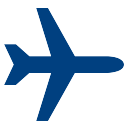

In [409]:
import pkgutil, os, json
import PIL.Image, PIL.ImageDraw, PIL.ImageFont
im = PIL.Image.new('RGBA', (128,128), (255,255,255,0))
draw = PIL.ImageDraw.Draw(im)
fontdir = os.path.join(pkgutil.get_loader('qtawesome').filename, 'fonts')
char = unichr(int(json.load(open(os.path.join(fontdir, 'elusiveicons-webfont-charmap.json'), 'rb'))['plane'], 0))
font = PIL.ImageFont.truetype(os.path.join(fontdir, 'elusiveicons-webfont.ttf'), 120)
draw.text((4,4), char, fill=(0,64,128), font=font)
im

In [410]:
def segment_intersects(seg1, seg2):
    x11, x12 = seg1
    x21, x22 = seg2
    return x12 >= x21 and x11 <= x22

def bbox_intersects(bbox1, bbox2):
    x11, y11, x12, y12 = bbox1
    x21, y21, x22, y22 = bbox2
    return segment_intersects([x11, x12], [x21, x22]) and segment_intersects([y11, y12], [y21, y22])

7343 городов
25413 железных дорог
56601 дорог
891 аэропортов


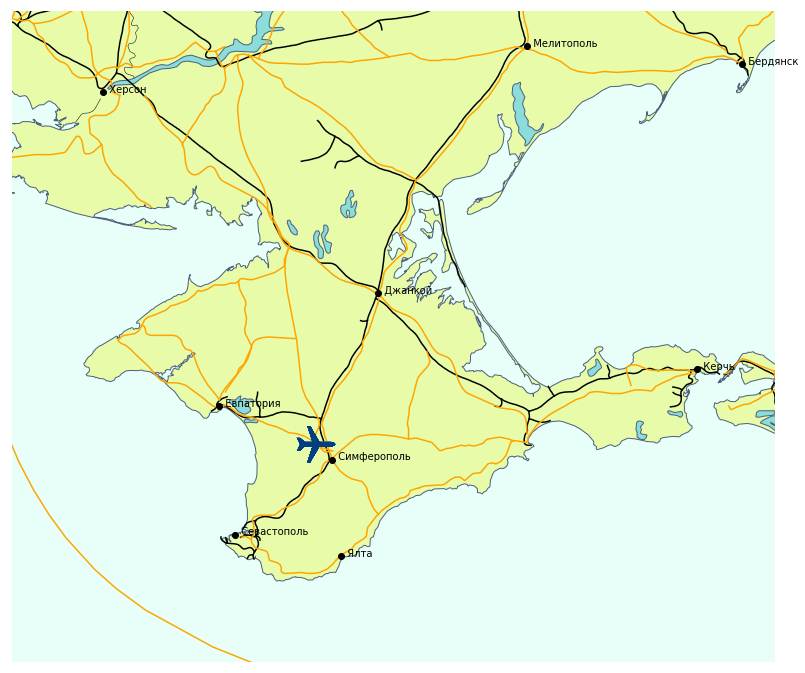

In [421]:
figure(figsize=(15,12))

m = Basemap(llcrnrlon=bbox[0], llcrnrlat=bbox[1], urcrnrlon=bbox[2], urcrnrlat=bbox[3],
            rsphere=(6378137.00, 6356752.3142),
            resolution='h', projection='merc')

r = shapefile.Reader(r"C:\Users\User\Downloads\ne_10m_populated_places\ne_10m_populated_places.shp")
field_names = [descr[0] for descr in r.fields[1:]]
shape_info = [dict(zip(field_names, record)) for record in r.records()]
print len(r.shapes()), 'городов'
for info, shape in zip(shape_info, r.shapes()):
    lon, lat = shape.points[0]
    if bbox_intersects([lon, lat, lon, lat], bbox):
        x, y = m(lon, lat)
        text(x, y, '  ' + info['name_ru'].decode('utf-8'), zorder=4);
        m.scatter(x, y, zorder=4, c='k')

r = shapefile.Reader(r"C:\Users\User\Downloads\ne_10m_railroads\ne_10m_railroads.shp")
print len(r.shapes()), 'железных дорог'
for shape in r.shapes():
    if bbox_intersects(shape.bbox, bbox):
        gca().add_line(Line2D(*m(*array(shape.points).T), color='k'))

r = shapefile.Reader(r"C:\Users\User\Downloads\ne_10m_roads\ne_10m_roads.shp")
print len(r.shapes()), 'дорог'
for shape in r.shapes():
    if bbox_intersects(shape.bbox, bbox):
        gca().add_line(Line2D(*m(*array(shape.points).T), color='orange'))

r = shapefile.Reader(r"C:\Users\User\Downloads\ne_10m_airports\ne_10m_airports.shp")
print len(r.shapes()), 'аэропортов'
for shape in r.shapes():
    lon, lat = shape.points[0]
    if bbox_intersects([lon, lat, lon, lat], bbox):
        x, y= m(lon, lat)
        size = 15000
        imshow(im, extent=[coords[0] - size, coords[0] + size, coords[1] - size, coords[1] + size], zorder=2)

m.drawcoastlines(color=COAST)
m.drawmapboundary(color='w', fill_color=SEA)
m.fillcontinents(color='#E8FBA9', lake_color=LAKE)
m.drawrivers();

Феодосия? Не, не слышали.

## Экспорт

График можно сохранить в графический файл или в Data URL в HTML-отчет, если использовать `savefig` и file-подобный объект.


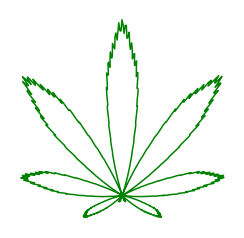

In [215]:
import urllib
from io import BytesIO

def plot2bytes(draw_fn, fmt='png'):
    ioff()
    draw_fn()
    with BytesIO() as f:
        savefig(f, format=fmt, bbox_inches='tight')
        data = f.getvalue()
    close()
    ion()
    return data

def bytes2dataurl(bytes, mime='image/png'):
    return 'data:%s;base64,%s' % (mime, urllib.base64.b64encode(bytes))

def dataurl2img(url):
    return '<img src="%s">' % url

def plot2img(fn, fmt='png', mime='image/png'):
    return dataurl2img(bytes2dataurl(plot2bytes(fn, fmt), mime))


def f():
    x = linspace(0, 2 * pi, num=1000)
    rs = (1 + sin(9 * x)) * (1 + sin(x)) * (1 + 0.03 * sin(9 * 5 * x)) * (1 + 0.04 * sin(9 * 33 * x))
    gca().set_aspect('equal')
    for side in 'left right top bottom'.split():
        axes().spines[side].set_color('none')
    xticks([]); yticks([])
    plot(rs * cos(x), rs * sin(x), 'g')

display(IPython.display.HTML(plot2img(f)))

Кроме PNG полезны SVG и EPS. EPS позволяет вставлять графики в LaTeX следующим путем:

* Ставим LaTeX (команды для Ubuntu)

```bash
sudo apt install texlive texlive-pictures texlive-font-utils -y
```

* Сохраняем график в файл `sample.eps`

```python
file_put('sample.eps', plot2bytes(plot_fn, 'eps'))
```

* Пишем документ `test.tex` (`[h]` — значит here)

```latex
\documentclass{article}
\usepackage{graphicx}
\usepackage[utf8]{inputenc}
\begin{document}
  \begin{figure}[h]
    \begin{center}
      \includegraphics[width=\textwidth]{sample.eps}
      \caption{Figure caption}
    \end{center}
  \end{figure}
\end{document}
```

* Собираем `test.tex`

```bash
pdflatex test.tex
```

* Смотрим `test.pdf`

## plotly

Другой популярной библиотекой для графиков, заточенной под отображение в web, является `plotly`. Значительную часть функционала они продают, но оффлайн-графики для Jupyter Notebook сделали бесплатными. https://plot.ly/python/getting-started/

```
pip install plotly
```

In [1]:
import plotly
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly.figure_factory as ff

init_notebook_mode(connected=True)

Линейный график с подписями осей и графика

In [7]:
dataX = linspace(-2, 2)
dataY = dataX ** 2

iplot(go.Figure(
    data = [go.Scatter(x=dataX, y=dataY)],
    layout = go.Layout(xaxis={'title': 'x'}, yaxis={'title': 'y'}, title={'text': 'Title'})
))

In [8]:
planets_data = '''\
Меркурий	0,055	0,38	0,241
Венера	0,815	0,72	0,615
Земля	1,0	1,0	1,0
Марс	0,107	1,52	1,88
Юпитер	318	5,20	11,86
Сатурн	95	9,54	29,46
Уран	14,6	19,22	84,01
Нептун	17,2	30,06	164,79
'''.replace(',', '.').splitlines()

planets = []
for line in planets_data:
    name, mass, dist, year = line.split('\t')
    planets.append({'name': name, 'mass': float(mass), 'dist': float(dist), 'year': float(year)})

Скаттер (подписи, цвет, размер), логарифмические оси, линия поверх

In [21]:
iplot(go.Figure(
    data=[go.Scatter(
        x=[p['dist'] for p in planets],
        y=[p['year'] for p in planets],
        text=[p['name'] for p in planets],
        marker={
            'color': ['white', 'orange', 'blue', 'red', 'violet', 'yellow', 'green', 'blue'],
            'size': [p['mass'] + 5 for p in planets]
        },
        mode='markers+text'
    )],
    layout=go.Layout({
        'xaxis': {'type': 'log', 'title': 'Радиус орбиты, а.е.'},
        'yaxis': {'type': 'log', 'title': 'Год, земные годы'},
        'shapes': [{
            'type': 'line', 'x0': 0.3, 'y0': 0.3 ** 1.5, 'x1': 40, 'y1': 40 ** 1.5,
            'line': {'color': 'gray', 'width': 2, 'dash': 'dot'}
        }]
    })
))

Подграфики

In [16]:
fig = plotly.tools.make_subplots(rows=2, cols=2, subplot_titles=('Histogram', 'Bar', 'Heatmap', 'Histogram2d'))

fig.append_trace(go.Histogram(x=[1, 2, 3, 3, 3, 4, 5]), 1, 1)
fig.append_trace(go.Bar(x=[1,3], y=[1,2]), 1, 2)
fig.append_trace(go.Heatmap(z=[[1,2,3,4], [5,6,7,8]]), 2, 1)
fig.append_trace(go.Histogram2d(x=[1, 2, 3, 3, 3, 4, 5], y=[1, 2, 3, 3, 3, 4, 5], colorscale='Viridis'), 2, 2)

fig['layout'].update(title='Multiple Subplots with Titles')

iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



3D график

In [18]:
s = linspace(0, 2 * pi, 240)
t = linspace(0, pi, 240)
tGrid, sGrid = meshgrid(s, t)

r = 2 + sin(7 * sGrid + 5 * tGrid)
x = r * cos(sGrid) * sin(tGrid)
y = r * sin(sGrid) * sin(tGrid)
z = r * cos(tGrid)

axe_settings = dict(
    gridcolor='rgb(255, 255, 255)',
    zerolinecolor='rgb(255, 255, 255)',
    showbackground=True,
    backgroundcolor='rgb(230, 230, 230)'
)

layout = go.Layout(
    title='Parametric Plot',
    scene={'xaxis': axe_settings, 'yaxis': axe_settings, 'zaxis': axe_settings}
)

fig = go.Figure(data=[go.Surface(x=x, y=y, z=z)], layout=layout)
iplot(fig)

График на карте

In [20]:
iplot([{
    'type': 'scattergeo',
    'lon': [-82, 151, 36],
    'lat': [23, -34, 45],
    'text': ['Habana', 'Sydney', 'Kerch'],
    'marker': {
        'color': ['red', 'blue', 'orange'],
        'size': [30, 50, 60],
        'symbol': ['hexagon', 'cross-dot', 'triangle-up-dot']
    },
    'mode': 'markers+text'
}])